In [11]:
import pandas as pd
import numpy as np
from Strategies import *
from StrategyTester import StrategyTester
from StrategyOptimizer import StrategyOptimizer

import warnings
warnings.filterwarnings('ignore')

In [2]:
data_all=pd.read_csv('oanda_EURUSD_1_year.csv', parse_dates=['Date'], index_col='Date')

In [3]:
data_all

,Open,High,Low,Close,vol,spread,pips
Date,,,,,,,
2022-05-02 00:00:00,1.05349,1.05402,1.05348,1.05394,291,0.000100,1.00
2022-05-02 00:01:00,1.05393,1.05401,1.05390,1.05398,203,0.000100,1.00
2022-05-02 00:02:00,1.05399,1.05410,1.05391,1.05404,170,0.000100,1.00
2022-05-02 00:03:00,1.05406,1.05450,1.05406,1.05443,163,0.000100,1.00
2022-05-02 00:04:00,1.05443,1.05448,1.05431,1.05436,106,0.000100,1.00
...,...,...,...,...,...,...,...
2023-04-28 20:54:00,1.10174,1.10174,1.10168,1.10168,19,0.000095,0.95
2023-04-28 20:55:00,1.10168,1.10176,1.10166,1.10172,67,0.000095,0.95
2023-04-28 20:56:00,1.10174,1.10176,1.10166,1.10168,44,0.000095,0.95


In [4]:
tester=StrategyTester(data=data_all, symbol='EURUSD', strategy_func=rsi_divergence)

In [5]:
tester.test_strategy(freq=15,window=14,order=10)

,buy_and_hold,rsi_divergence_strategy
simple_return,1.04407,1.44765
mean_return,0.04360,0.37404
stddev,0.10782,0.10764
sharpe_ratio,0.40440,3.47499
sortino_ratio,0.57739,5.08416
max_dd,0.11561,0.06872
cagr,0.04457,0.45359
calmar_ratio,0.38549,6.60034
kelly,0.03984,0.05987


In [6]:
tester.plot_results()

In [9]:
tester.plot_trades(start='2022-10-01', end='2022-11-30')

In [12]:
optimizer=StrategyOptimizer(folds=2, test_size=0.3,symbol='EUR_USD',
                    data_tester=data_all, strategy_func=rsi_divergence)

100%|█████████████████████████████████████████| 270/270 [02:09<00:00,  2.09it/s]


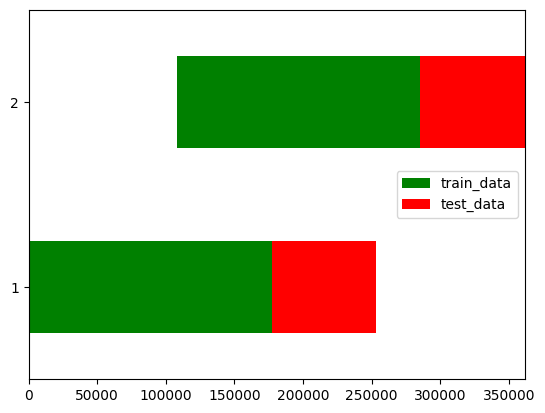

In [13]:
optimizer.test_params(freq=[15,30,45], window=(10,20,1), order=(2,11,1))

In [14]:
optimizer.results_overview.sort_values(by='simple_return', ascending=False)

,freq,window,order,simple_return,mean_return,stddev,sharpe_ratio,sortino_ratio,max_dd,cagr,calmar_ratio,kelly
39,15,14,5,1.339660,0.597540,0.116120,5.152005,7.816790,0.034785,0.828300,23.509915,0.077165
8,15,10,10,1.335000,0.592515,0.116210,5.099140,7.519210,0.051465,0.808605,15.896780,0.079940
30,15,13,5,1.327570,0.579090,0.116125,4.992785,7.564405,0.034785,0.794285,22.546920,0.073295
12,15,11,5,1.315615,0.561795,0.116115,4.842170,7.138740,0.036835,0.758060,21.138300,0.079830
38,15,14,4,1.312585,0.557685,0.116270,4.796310,7.119000,0.031830,0.746670,23.607710,0.060755
...,...,...,...,...,...,...,...,...,...,...,...,...
220,45,14,6,1.050470,0.098470,0.113520,0.859315,1.217675,0.061205,0.107920,2.284000,0.071455
211,45,13,6,1.050470,0.098470,0.113520,0.859315,1.217675,0.061205,0.107920,2.284000,0.071455
229,45,15,6,1.050470,0.098470,0.113520,0.859315,1.217675,0.061205,0.107920,2.284000,0.071455
164,30,18,4,1.043660,0.087330,0.116320,0.748865,1.060855,0.070725,0.091595,1.296665,0.067985


In [15]:
optimizer.forward_test()

100%|█████████████████████████████████████████| 270/270 [00:55<00:00,  4.88it/s]


In [16]:
tester.test_strategy(freq=15,window=14,order=5)

,buy_and_hold,rsi_divergence_strategy
simple_return,1.04407,1.60411
mean_return,0.04360,0.47780
stddev,0.10782,0.10752
sharpe_ratio,0.40440,4.44384
sortino_ratio,0.57739,6.65656
max_dd,0.11561,0.03755
cagr,0.04457,0.61253
calmar_ratio,0.38549,16.31318
kelly,0.03984,0.07827


In [17]:
tester.plot_results()